In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Load data
friendship_df = pd.read_csv('Friendship-network_data_2013_CLEANED.csv', sep='\t')
G_friend = nx.DiGraph()
G_friend.add_edges_from(friendship_df[['i', 'j']].astype(int).values)
contacts_df = pd.read_csv('High-School_data_2013_CLEANED.csv', sep='\t')
G_phys = nx.Graph()
G_phys.add_edges_from(contacts_df[['i', 'j']].astype(int).drop_duplicates().values)
diary_df = pd.read_csv('Contact-diaries-network_data_2013_CLEANED.csv', sep='\t')
G_diary = nx.DiGraph()
for row in diary_df.itertuples(index=False):
    G_diary.add_edge(int(row.i), int(row.j), weight=int(row.w))
fb_df = pd.read_csv('Facebook-known-pairs_data_2013_CLEANED.csv', sep='\t')
fb_pairs = pd.concat([fb_df['i'], fb_df['j']]).unique()

In [ ]:
meta_df = pd.read_csv('mt actual.txt', sep='\t', header=None, names=['ID', 'Class', 'Gender'])
meta_dict = meta_df.set_index('ID').to_dict(orient='index')

In [ ]:
for k, v in list(meta_dict.items())[:5]:
    print(k, v)


650 {'Class': '2BIO1', 'Gender': 'F'}
498 {'Class': '2BIO1', 'Gender': 'F'}
627 {'Class': '2BIO1', 'Gender': 'F'}
857 {'Class': '2BIO1', 'Gender': 'F'}
487 {'Class': '2BIO1', 'Gender': 'F'}


In [ ]:
# Master student list

students_all = set()
students_all.update(friendship_df['i'].unique(), friendship_df['j'].unique())
students_all.update(contacts_df['i'].unique(), contacts_df['j'].unique())
students_all.update(diary_df['i'].unique(), diary_df['j'].unique())
students_all.update(fb_df['i'].unique(), fb_df['j'].unique())


df_all = pd.DataFrame({'Student': sorted(students_all)})
meta_df = pd.read_csv('mt actual.txt', sep='\t', header=None, names=['ID', 'Class', 'Gender'])
df_all = df_all.merge(meta_df, how='left', left_on='Student', right_on='ID') # Merge metadata into df_all
df_all.drop(columns=['ID'], inplace=True)

df_all.head() # prints sample output

,Student,Class,Gender
0,1,2BIO3,M
1,3,2BIO2,M
2,4,PSI*,M
3,9,PC,M
4,14,PC*,M


In [ ]:
default_colors = ['orange', 'red', 'green', 'blue', 'darkblue', 'purple', 'brown', 'gray',]

In [ ]:
# Draw contact graph
def draw_contact_graph(G_phys, meta_dict):
  plt.figure(figsize=(50, 50))

  pos = nx.spring_layout(G_phys, k=1.3, iterations=350, seed=42)
  node_colors = []
  for node in G_phys.nodes():
      gender = meta_dict.get(node, {}).get('Gender', 'Unknown')
      if gender == 'M':
          node_colors.append('lightblue')
      elif gender == 'F':
          node_colors.append('lightpink')
      else:
          node_colors.append('gray')

  class_color_map = {}
  classes = list(set(meta_dict.get(u, {}).get('Class', 'Unknown') for u in G_phys.nodes()))
  for i, cls in enumerate(classes):
      class_color_map[cls] = default_colors[i % len(default_colors)]

  edge_colors = []
  edge_classes = []
  for u, v in G_phys.edges():
      student_class = meta_dict.get(u, {}).get('Class', 'Unknown')
      edge_colors.append(class_color_map.get(student_class, 'gray'))
      edge_classes.append(student_class)

  # Draw nodes
  nx.draw_networkx_nodes(
      G_phys, pos,
      node_color=node_colors,
      node_size=1000,
      edgecolors='black',
      linewidths=0.5
  )

  nx.draw_networkx_edges(
      G_phys, pos,
      edge_color=edge_colors,
      width=0.5,
      alpha=0.8
  )

  labels = {node: str(node) for node in G_phys.nodes()}
  nx.draw_networkx_labels(
      G_phys, pos,
      labels=labels,
      font_color='black',
      font_size=8,
      verticalalignment='center'
  )

  legend_patches = []
  for cls, color in class_color_map.items():
      legend_patches.append(mpatches.Patch(color=color, label=f'Class: {cls}'))

  plt.legend(handles=legend_patches, title='Class (Edge Color)', fontsize=10)

  plt.title('Physical Graph: Nodes by Gender, Edges by Class')
  plt.axis('off')
  plt.show()

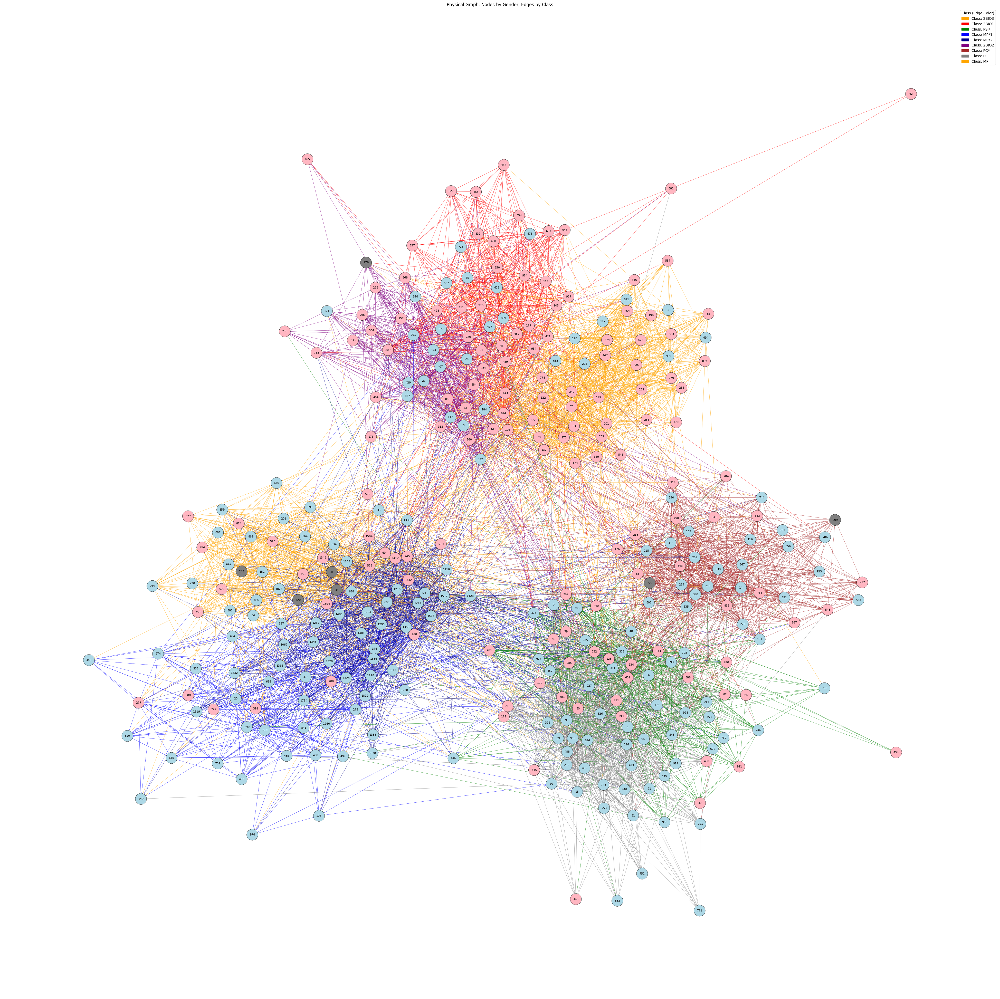

In [ ]:
draw_contact_graph(G_phys, meta_dict)

In [ ]:
# Draw friendship graph
def draw_friendship_graph(G_friend, meta_dict):
  plt.figure(figsize=(25, 25))
  pos = nx.spring_layout(G_friend, k=1.6, iterations=300, seed=42)
  node_colors = []
  for node in G_friend.nodes():
      gender = meta_dict.get(node, {}).get('Gender', 'Unknown')
      if gender == 'M':
          node_colors.append('lightblue')
      elif gender == 'F':
          node_colors.append('lightpink')
      else:
          node_colors.append('gray')

  nx.draw_networkx_nodes(
      G_friend, pos,
      node_color=node_colors,
      node_size=750,
      edgecolors='black',
      linewidths=0.5
  )

  nx.draw_networkx_edges(
      G_friend, pos,
      edge_color='lightgray',
      width=0.5,
      arrows=True,
      arrowsize=20,
      arrowstyle='-|>',
      connectionstyle='arc3,rad=0.1'
  )

  labels = {node: str(node) for node in G_friend.nodes()}
  nx.draw_networkx_labels(
      G_friend, pos,
      labels=labels,
      font_color='black',
      font_size=8,
      verticalalignment='center'
  )

  plt.title('Friendship Graph: Directed, Nodes by Gender')
  plt.axis('off')
  plt.show()

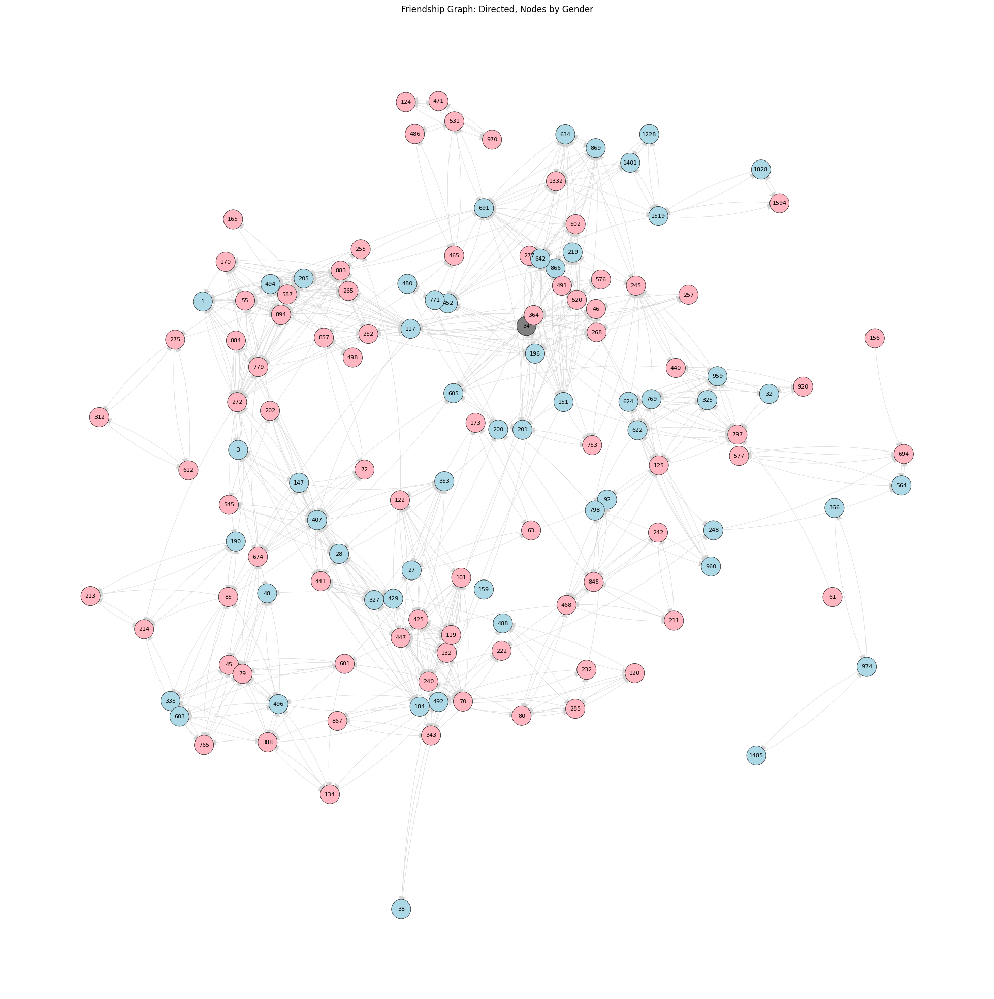

In [ ]:
draw_friendship_graph(G_friend, meta_dict)

In [ ]:
def draw_diary_graph_with_weight_colors(G_diary, meta_dict):
    plt.figure(figsize=(30, 30))
    pos = nx.spring_layout(G_diary, k=1.6, iterations=300, seed=42)

    node_colors = []
    for node in G_diary.nodes():
        gender = meta_dict.get(node, {}).get('Gender', 'Unknown')
        if gender == 'M':
            node_colors.append('lightblue')
        elif gender == 'F':
            node_colors.append('lightpink')
        else:
            node_colors.append('gray')
    edge_colors = []
    edge_weight_to_color = {}

    color_palette = ['purple', 'green', 'orange', 'blue', 'red', 'brown', 'cyan', 'magenta', 'gold', 'darkgreen']

    unique_weights = sorted(set(nx.get_edge_attributes(G_diary, 'weight').values()))
    for idx, weight in enumerate(unique_weights):
        color = color_palette[idx % len(color_palette)]
        edge_weight_to_color[weight] = color

    for u, v, data in G_diary.edges(data=True):
        w = data.get('weight', 1)
        color = edge_weight_to_color.get(w, 'gray')
        edge_colors.append(color)

    # Draw nodes
    nx.draw_networkx_nodes(
        G_diary, pos,
        node_color=node_colors,
        node_size=750,
        edgecolors='black',
        linewidths=0.5
    )

    # Draw edges (colored by weight)
    nx.draw_networkx_edges(
        G_diary, pos,
        edge_color=edge_colors,
        width=0.7,
        arrows=True,
        arrowsize=10,
        arrowstyle='-|>',
        connectionstyle='arc3,rad=0.0'
    )

    labels = {node: str(node) for node in G_diary.nodes()}
    nx.draw_networkx_labels(
        G_diary, pos,
        labels=labels,
        font_color='black',
        font_size=8,
        verticalalignment='center'
    )

    legend_patches = []
    for weight, color in edge_weight_to_color.items():
        legend_patches.append(mpatches.Patch(color=color, label=f'Weight: {weight}'))

    plt.legend(handles=legend_patches, title='Edge Weights (Colors)', fontsize=10)

    plt.title('Contact Diary Graph: Nodes by Gender, Edges Colored by Weight')
    plt.axis('off')
    plt.show()


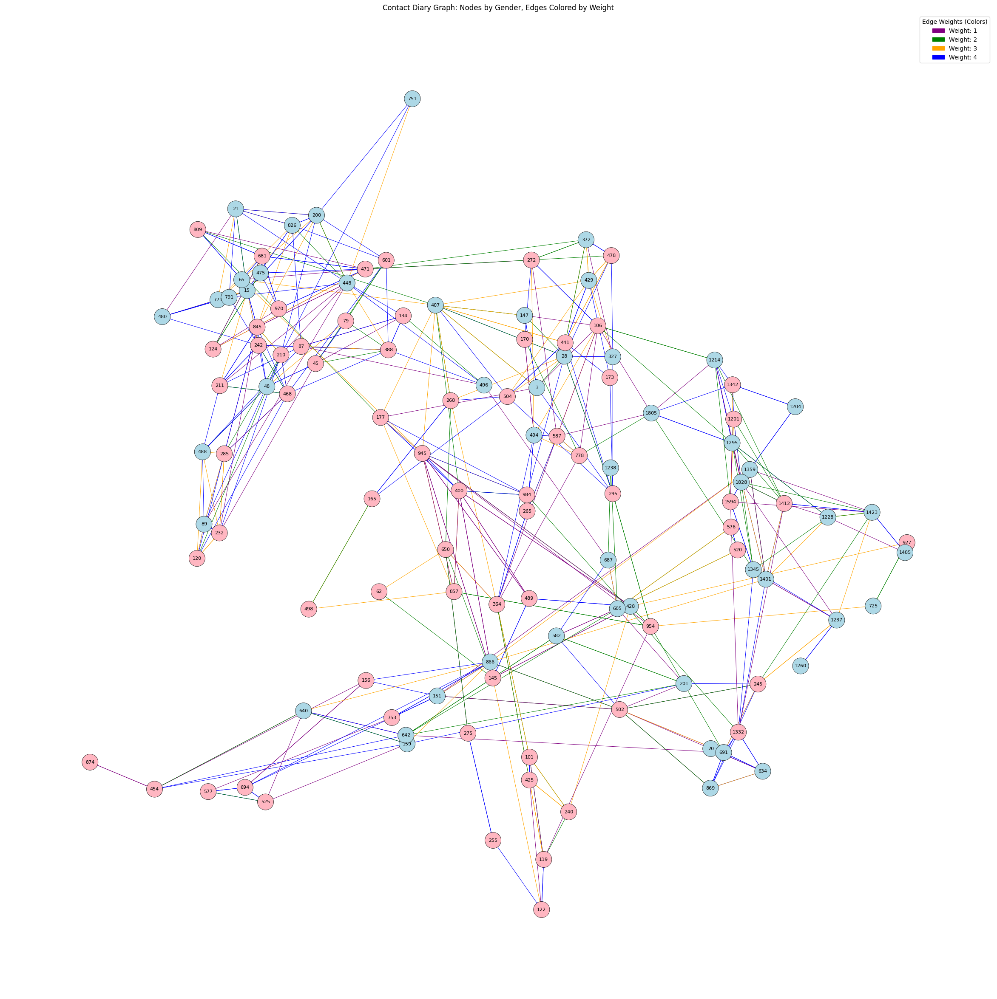

In [ ]:
draw_diary_graph_with_weight_colors(G_diary, meta_dict)


In [ ]:
def build_facebook_graph(fb_df):
  G_fb = nx.Graph()
  for row in fb_df.itertuples(index=False):
      u, v, val = int(row.i), int(row.j), int(row.w)
      G_fb.add_edge(u, v, weight=val)
  return G_fb

In [ ]:
G_fb = build_facebook_graph(fb_df)

In [ ]:
def build_and_draw_facebook_graph(G_fb, meta_dict):
  plt.figure(figsize=(30, 30))

  pos = nx.spring_layout(G_fb, k=1.6, iterations=300, seed=42)

  node_colors = []
  for node in G_fb.nodes():
      gender = meta_dict.get(node, {}).get('Gender', 'Unknown')
      if gender == 'M':
          node_colors.append('lightblue')
      elif gender == 'F':
          node_colors.append('lightpink')
      else:
          node_colors.append('gray')

  edge_colors = []
  for u, v, data in G_fb.edges(data=True):
      weight = data.get('weight')
      if weight == 1:
          edge_colors.append('black')


  nx.draw_networkx_nodes(
      G_fb, pos,
      node_color=node_colors,
      node_size=750,
      edgecolors='black',
      linewidths=0.5
  )

  nx.draw_networkx_edges(
      G_fb, pos,
      edge_color=edge_colors,
      width=0.1
  )

  labels = {node: str(node) for node in G_fb.nodes()}
  nx.draw_networkx_labels(
      G_fb, pos,
      labels=labels,
      font_color='black',
      font_size=8,
      verticalalignment='center'
  )

  legend_patches = [
      mpatches.Patch(color='black', label='Facebook Friend (1)'),

  ]
  plt.legend(handles=legend_patches, title='Edge Meaning', fontsize=10)

  plt.title('Facebook Graph: Edges only where friendship exists')
  plt.axis('off')
  plt.show()

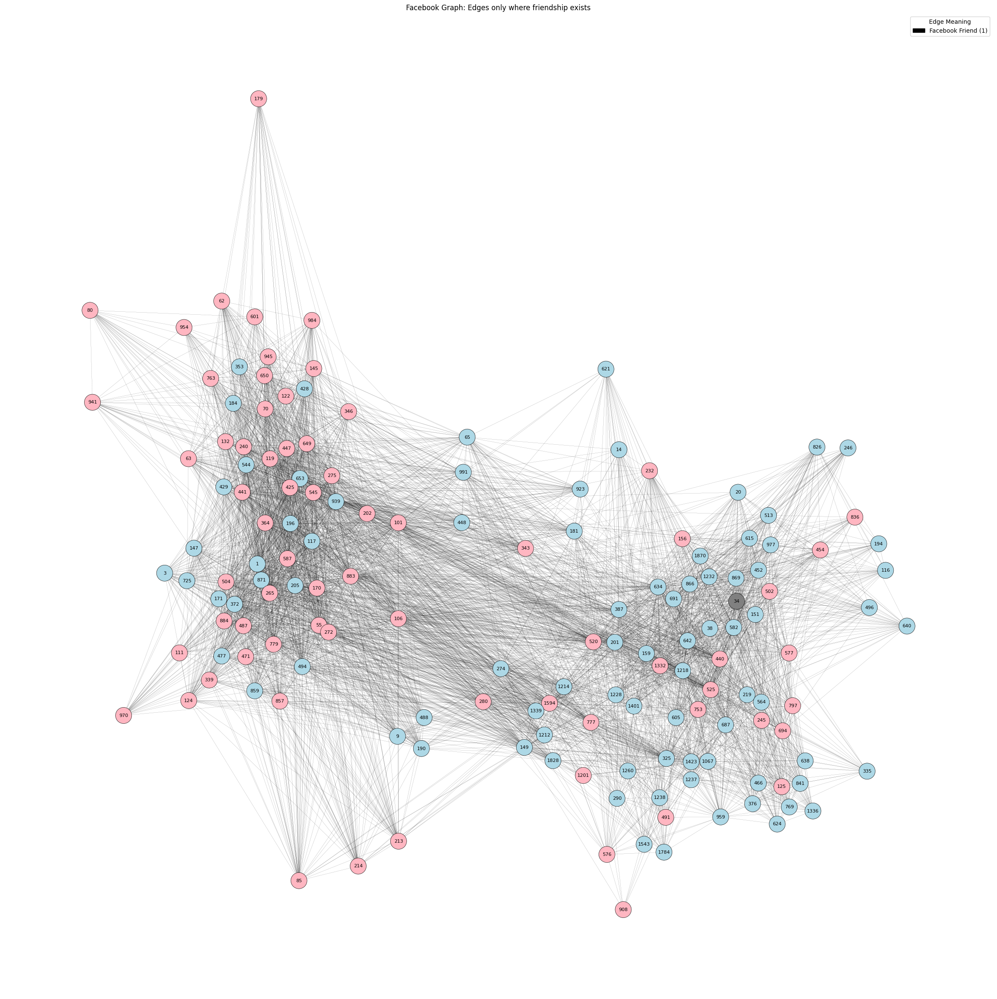

In [ ]:
build_and_draw_facebook_graph(G_fb, meta_dict)

In [ ]:
# Add presence flags in here
df_all['In_Friendship'] = df_all['Student'].isin(G_friend.nodes)
df_all['In_Physical'] = df_all['Student'].isin(G_phys.nodes)
df_all['In_Diary'] = df_all['Student'].isin(G_diary.nodes)
df_all['Has_Facebook_Friends'] = df_all['Student'].isin(fb_pairs)

In [ ]:
df_all.head()

,Student,Class,Gender,In_Friendship,In_Physical,In_Diary,Has_Facebook_Friends
0,1,2BIO3,M,True,True,False,True
1,3,2BIO2,M,True,True,True,True
2,4,PSI*,M,False,True,False,False
3,9,PC,M,False,True,False,True
4,14,PC*,M,False,True,False,True


In [ ]:
df_all['Friend_In_Degree'] = df_all['Student'].map(lambda x: G_friend.in_degree(x) if G_friend.has_node(x) else 0)
df_all['Friend_Out_Degree'] = df_all['Student'].map(lambda x: G_friend.out_degree(x) if G_friend.has_node(x) else 0)
df_all['Reciprocal_Count'] = df_all['Student'].map(lambda x: sum(1 for nbr in G_friend.successors(x) if G_friend.has_edge(nbr, x)) if G_friend.has_node(x) else 0)
df_all['Reciprocity_Ratio'] = df_all.apply(lambda row: (row['Reciprocal_Count'] / row['Friend_Out_Degree']) if row['Friend_Out_Degree'] > 0 else 0, axis=1)


df_all['Physical_Contacts'] = df_all['Student'].map(lambda x: G_phys.degree(x) if G_phys.has_node(x) else 0)

In [ ]:
df_all

,Student,Class,Gender,In_Friendship,In_Physical,In_Diary,Has_Facebook_Friends,Friend_In_Degree,Friend_Out_Degree,Reciprocal_Count,Reciprocity_Ratio,Physical_Contacts,Diary_Strength,Diary_In_Degree
0,1,2BIO3,M,True,True,False,True,11,6,6,1.000000,23,0,0
1,3,2BIO2,M,True,True,True,True,4,7,4,0.571429,56,14,7
2,4,PSI*,M,False,True,False,False,0,0,0,0.000000,35,0,0
3,9,PC,M,False,True,False,True,0,0,0,0.000000,69,0,0
4,14,PC*,M,False,True,False,True,0,0,0,0.000000,38,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
323,1805,MP*2,M,False,True,True,False,0,0,0,0.000000,38,6,13
324,1819,MP*2,M,False,True,False,False,0,0,0,0.000000,31,0,0
325,1828,MP*2,M,True,True,True,True,2,2,2,1.000000,29,14,12
326,1870,MP*2,M,False,True,False,True,0,0,0,0.000000,15,0,0


In [ ]:
diary_strengths = {}
for node in G_diary.nodes:
    total_strength = sum(d['weight'] for _, _, d in G_diary.out_edges(node, data=True))
    diary_strengths[node] = total_strength
df_all['Diary_Strength'] = df_all['Student'].map(lambda x: diary_strengths.get(x, 0))
df_all['Diary_In_Degree'] = df_all['Student'].map(lambda x: G_diary.in_degree(x, weight='weight') if G_diary.has_node(x) else 0)


In [ ]:
def compute_group(row):
  if row['In_Friendship'] and row['In_Physical'] and row['In_Diary']:
    return 'Group A: Full data'
  elif row['In_Friendship'] and row['In_Physical']:
    return 'Group B: Friend + Physical'
  elif row['In_Physical']:
    return 'Group C: Physical only'
  elif row['In_Friendship']:
    return 'Group E: Friendship only'
  else:
    return 'Group D: Limited data'

In [ ]:
df_all['Data_Group'] = df_all.apply(compute_group, axis=1)

In [ ]:
def assess_isolation(row):
  group = row['Data_Group']

  # Define isolated conditions
  friend_isolated = (row['Friend_In_Degree'] == 0)
  reciprocity_isolated = (row['Reciprocity_Ratio'] < 0.5)
  physical_isolated = (row['Physical_Contacts'] == 0)
  diary_isolated = (row['Diary_Strength'] <= 3)

  if group == 'Group A: Full data':
    isolation_count = sum([
      friend_isolated,
      reciprocity_isolated,
      physical_isolated,
      diary_isolated
    ])
    if isolation_count >= 2:
      return 'Highly Isolated'
    elif isolation_count == 1:
      return 'Moderately Isolated'
    else:
      return 'Not Isolated'

  elif group == 'Group B: Friend + Physical':
    isolation_count = sum([
      friend_isolated,
      reciprocity_isolated,
      physical_isolated
    ])
    if isolation_count >= 2:
      return 'Highly Isolated'
    elif isolation_count == 1:
      return 'Moderately Isolated'
    else:
      return 'Not Isolated'

  elif group == 'Group C: Physical only':
    if physical_isolated:
      return 'Moderately Isolated'
    else:
      return 'Not Isolated'

  elif group == 'Group E: Friendship only':
    isolation_count = sum([
      friend_isolated,
      reciprocity_isolated
    ])
    if isolation_count >= 2:
      return 'Highly Isolated'
    elif isolation_count == 1:
      return 'Moderately Isolated'
    else:
      return 'Not Isolated'

  else:
    return 'Insufficient Data'


In [ ]:
df_all['Isolation_Flag'] = df_all.apply(assess_isolation, axis=1)
print(df_all['Isolation_Flag'].value_counts())


Isolation_Flag
Not Isolated           312
Moderately Isolated     12
Highly Isolated          3
Insufficient Data        1
Name: count, dtype: int64


In [ ]:
df_all['Isolation_Flag'] = df_all.apply(assess_isolation, axis=1)

isolation_counts = df_all['Isolation_Flag'].value_counts().reset_index()
isolation_counts.columns = ['Isolation Category', 'Count']

In [ ]:
print("===========================")
print("Isolation Category Counts:")
isolation_counts

Isolation Category Counts:


,Isolation Category,Count
0,Not Isolated,312
1,Moderately Isolated,12
2,Highly Isolated,3
3,Insufficient Data,1


In [ ]:
from IPython.display import display
# Display top students per category
def display_top_students_per_category(df_all):
  categories = df_all['Isolation_Flag'].unique()
  for category in categories:
    print("===========================")
    print(f"Isolation Category: {category}")

    df_cat = df_all[df_all['Isolation_Flag'] == category]

    df_sorted = df_cat.sort_values(
      by=['Friend_In_Degree', 'Physical_Contacts', 'Diary_Strength'],
      ascending=False
  )

    top_n = df_sorted.head(5)

    if top_n.empty:
      print("No students found in this category.\n")
      continue
    df_table = top_n[[
      'Student',
      'Friend_In_Degree',
      'Friend_Out_Degree',
      'Reciprocity_Ratio',
      'Physical_Contacts',
      'Diary_Strength',
      'Facebook_Friend_Count',
      'FB_Friend_Level',
      'Data_Group'
    ]].reset_index(drop=True)

    df_table.columns = [
      'Student',
      'Friend In',
      'Friend Out',
      'Reciprocity',
      'Physical Contacts',
      'Diary Strength',
      'FB Friends',
      'FB Level',
      'Data Group'
    ]

    df_table['Reciprocity'] = df_table['Reciprocity'].round(2)
    display(df_table)


In [ ]:
fb_df = pd.read_csv('Facebook-known-pairs_data_2013_CLEANED.csv', sep='\t')

In [ ]:
fb_connected = fb_df[fb_df['w'] == 1]
G_fb = nx.Graph()
G_fb.add_edges_from(fb_connected[['i', 'j']].astype(int).drop_duplicates().values)
fb_friend_counts = dict(G_fb.degree())
df_all['Facebook_Friend_Count'] = df_all['Student'].map(lambda x: fb_friend_counts.get(x, 0))
fb_with_friends = df_all[df_all['Facebook_Friend_Count'] > 0]
avg_fb_friends = fb_with_friends['Facebook_Friend_Count'].mean()
print(f"Average Facebook Friends: {avg_fb_friends:.2f}")
def fb_friend_level(count, avg_count):
  if count == 0:
    return 'No Facebook Friends'
  elif count < avg_count:
    return 'Less than Average'
  elif count == avg_count:
    return 'Equal to Average'
  else:
    return 'Greater than Average'

df_all['FB_Friend_Level'] = df_all['Facebook_Friend_Count'].apply(lambda x: fb_friend_level(x, avg_fb_friends))



Average Facebook Friends: 18.42


In [ ]:
display_top_students_per_category(df_all)

Isolation Category: Not Isolated


,Student,Friend In,Friend Out,Reciprocity,Physical Contacts,Diary Strength,FB Friends,FB Level,Data Group
0,272,15,11,0.82,76,6,49,Greater than Average,Group A: Full data
1,691,13,10,0.90,41,18,26,Greater than Average,Group A: Full data
2,407,12,13,0.85,49,21,0,No Facebook Friends,Group A: Full data
3,883,12,13,0.77,30,0,36,Greater than Average,Group B: Friend + Physical
4,117,11,16,0.69,40,0,19,Greater than Average,Group B: Friend + Physical


Isolation Category: Moderately Isolated


,Student,Friend In,Friend Out,Reciprocity,Physical Contacts,Diary Strength,FB Friends,FB Level,Data Group
0,452,8,5,0.40,38,0,20,Greater than Average,Group B: Friend + Physical
1,496,7,8,0.88,56,1,5,Less than Average,Group A: Full data
2,866,5,9,0.44,51,29,27,Greater than Average,Group A: Full data
3,85,5,7,0.43,43,0,4,Less than Average,Group B: Friend + Physical
4,151,5,13,0.38,39,19,34,Greater than Average,Group A: Full data


Isolation Category: Highly Isolated


,Student,Friend In,Friend Out,Reciprocity,Physical Contacts,Diary Strength,FB Friends,FB Level,Data Group
0,61,0,1,0.0,51,0,0,No Facebook Friends,Group B: Friend + Physical
1,156,0,1,0.0,43,2,20,Greater than Average,Group A: Full data
2,159,0,2,0.0,31,16,12,Less than Average,Group A: Full data


Isolation Category: Insufficient Data


,Student,Friend In,Friend Out,Reciprocity,Physical Contacts,Diary Strength,FB Friends,FB Level,Data Group
0,478,0,0,0.0,0,10,0,No Facebook Friends,Group D: Limited data


In [ ]:
def analyze_isolation_vs_gender_class(df_all):

  df_filtered = df_all[df_all['Isolation_Flag'] != 'Insufficient Data ❓']
  print("===============================")
  print("Gender balance check")
  print("===============================")
  gender_counts = df_all['Gender'].value_counts(dropna=False)
  gender_perc = df_all['Gender'].value_counts(normalize=True, dropna=False) * 100
  gender_df = pd.DataFrame({'Count': gender_counts, 'Percentage': gender_perc.round(2)})
  display(gender_df)

  print("===============================")
  print("class balance chek")
  print("===============================")
  class_counts = df_all['Class'].value_counts(dropna=False)
  class_perc = df_all['Class'].value_counts(normalize=True, dropna=False) * 100
  class_df = pd.DataFrame({'Count': class_counts, 'Percentage': class_perc.round(2)})
  display(class_df)

  print("===============================")
  print("isolation level vs gender")
  print("===============================")
  iso_gender_ct = pd.crosstab(df_filtered['Isolation_Flag'], df_filtered['Gender'], margins=True)
  display(iso_gender_ct)

  print("===============================")
  print("Percent Breakdown (Row-wise %)")
  iso_gender_perc = iso_gender_ct.div(iso_gender_ct['All'], axis=0) * 100
  iso_gender_perc = iso_gender_perc.drop(columns='All').round(2)
  display(iso_gender_perc)

  print("===============================")
  print("Isolation level vs class")
  print("===============================")
  iso_class_ct = pd.crosstab(df_filtered['Isolation_Flag'], df_filtered['Class'], margins=True)
  display(iso_class_ct)

  print("===============================")
  print("Percent Breakdown (Row-wise %)")
  iso_class_perc = iso_class_ct.div(iso_class_ct['All'], axis=0) * 100
  iso_class_perc = iso_class_perc.drop(columns='All').round(2)
  display(iso_class_perc)


In [ ]:
analyze_isolation_vs_gender_class(df_all)


Gender balance check


,Count,Percentage
Gender,,
M,175,53.35
F,146,44.51
Unknown,7,2.13


class balance chek


,Count,Percentage
Class,,
PC,44,13.41
2BIO3,40,12.20
PC*,39,11.89
MP*2,38,11.59
2BIO1,36,10.98
2BIO2,35,10.67
PSI*,34,10.37
MP,33,10.06
MP*1,29,8.84


isolation level vs gender


Gender,F,M,Unknown,All
Isolation_Flag,,,,
Highly Isolated,2,1,0,3
Insufficient Data,1,0,0,1
Moderately Isolated,3,9,0,12
Not Isolated,140,165,7,312
All,146,175,7,328


Percent Breakdown (Row-wise %)


Gender,F,M,Unknown
Isolation_Flag,,,
Highly Isolated,66.67,33.33,0.00
Insufficient Data,100.00,0.00,0.00
Moderately Isolated,25.00,75.00,0.00
Not Isolated,44.87,52.88,2.24
All,44.51,53.35,2.13


Isolation level vs class


Class,2BIO1,2BIO2,2BIO3,MP,MP*1,MP*2,PC,PC*,PSI*,All
Isolation_Flag,,,,,,,,,,
Highly Isolated,0,1,0,2,0,0,0,0,0,3
Insufficient Data,0,1,0,0,0,0,0,0,0,1
Moderately Isolated,1,1,0,4,0,0,2,1,3,12
Not Isolated,35,32,40,27,29,38,42,38,31,312
All,36,35,40,33,29,38,44,39,34,328


Percent Breakdown (Row-wise %)


Class,2BIO1,2BIO2,2BIO3,MP,MP*1,MP*2,PC,PC*,PSI*
Isolation_Flag,,,,,,,,,
Highly Isolated,0.00,33.33,0.00,66.67,0.00,0.00,0.00,0.00,0.00
Insufficient Data,0.00,100.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
Moderately Isolated,8.33,8.33,0.00,33.33,0.00,0.00,16.67,8.33,25.00
Not Isolated,11.22,10.26,12.82,8.65,9.29,12.18,13.46,12.18,9.94
All,10.98,10.67,12.20,10.06,8.84,11.59,13.41,11.89,10.37


In [ ]:
# print(df_all.columns.tolist())
